In [1]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import pandas as pd

import h5py
import os

In [15]:
# mt : maintenance (마취구간)
# emergence : 환자가 깨어나는 구간
# rest : PACU 병동에 있을 때의 뇌파로 환자가 수술 후 회복실에 있을 때

emer1_path ="C:/Users/admin/Desktop/Lab/Lab/data/emer1"
emer2_path ="C:/Users/admin/Desktop/Lab/Lab/data/emer2"
emer3_path = "C:/Users/admin/Desktop/Lab/Lab/data/emer3"

mt_path = "C:/Users/admin/Desktop/Lab/Lab/data/mt"
rest_path = "C:/Users/admin/Desktop/Lab/Lab/data/rest"



def data_loader(path):
    file_list = os.listdir(path)
    data = []
    
    for file_name in file_list:
        if file_name.endswith('.mat'):
            file_path = os.path.join(path, file_name)
            with h5py.File(file_path, 'r') as f:
                
                for dataset_name in f:
                    dataset = f[dataset_name][()]
                    data.append(dataset)
    
    return data


#.mat 파일은 3D 배열로 되어 있으며
# 데이터의 형태는 (채널 수, 시간 단계 수, 샘플 수)입니다. 

emer1 = data_loader(emer1_path)
emer2 = data_loader(emer2_path)
emer3 = data_loader(emer3_path)

mt = data_loader(mt_path)
rest = data_loader(rest_path)

# emer_data = data_loader(emer_sub)
# mt_data = data_loader(mt_sub)
# rest_data = data_loader(rest_sub)



In [16]:
# channel 분석
print("emer_channel = {}".format(emer1[0].shape)) # -> 19 x 50001
print('mt_channel = {}'.format(mt[0].shape))
print('rest_shape = {}'.format(rest[0].shape[0]))

# mat2fif (data 변환)
def mat2fif(data):
    fif_data = []
    for i in range(len(data)):
        
        #channel_names = ['CH{}'.format(i+1) for i in range(data[i].shape[0])]
        channel_names = ['Fp1' , 'Fp2',
                         'F7','F3','Fz','F4','F8',
                         'T3','C3','Cz','C4','T4',
                         'T5','P3','Pz','P4','T6',
                         'O1','O2']
        info = mne.create_info(ch_names=channel_names, sfreq=500, ch_types='eeg')
        raw = mne.io.RawArray(data[i] , info)
        # raw.set_montage('standard_1020')
        fif_data.append(raw)
    
    return fif_data

fif_emer1 = mat2fif(emer1)
fif_emer2 = mat2fif(emer2)
fif_emer3 = mat2fif(emer3)
fif_mt = mat2fif(mt)
fif_rest = mat2fif(rest)

# fif_emer_sub = mat2fif(emer_data)
# fif_mt_sub = mat2fif(mt_data)
# fif_rest_sub= mat2fif(rest_data)


emer_channel = (19, 50001)
mt_channel = (19, 150001)
rest_shape = 19
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float64 data, n_channels=19, n_times=50001
    Range : 0 ... 50000 =      0.000 ...   100.000 secs
Ready.
Creating RawArray with float

In [17]:
# fif data check
print(fif_emer1) # 19 x 50001 (100 s) , 깨어있는구간
print(fif_emer2) # 19 x 50001 (100 s) , 깨어있는구간
print(fif_emer3) # 19 x 50001 (100 s) , 깨어있는구간

print(fif_mt) # 19 x 150001 (100 s) , 마취구간
print(fif_rest) # 19 x 50001 (100 s) , PACU 병동에 있을 때의 뇌파로 환자가 수술 후 회복실에 있을 때

[<RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 s), ~7.3 MB, data loaded>, <RawArray | 19 x 50001 (100.0 

In [18]:
# 채널 분석

def ch_dect(data):
    for i in range(len(data)):
        ch = data[i].plot(n_channels = 19 , scalings = {'eeg': 100})
        ch.savefig('time_2_f_{}'.format(2*i + 1))

# 
        
fif_emer1_copy = fif_emer1.copy()
fif_emer2_copy = fif_emer2.copy()
fif_emer3_copy = fif_emer3.copy()

fif_rest_copy = fif_rest.copy()
fif_mt_copy = fif_mt.copy()



In [10]:
fif_emer1_copy[0].apply_function(lambda x: x * 1e-9)


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,500.00 Hz
Highpass,0.00 Hz
Lowpass,250.00 Hz


In [20]:
# Ch interpolation

def ch_interpolation(data,i,chs):
    data[i].info['bads'].extend(chs)
    montage = mne.channels.make_standard_montage('standard_1020')
    data[i].set_montage(montage)
    data[i].interpolate_bads(reset_bads = True)
    data[i].filter(l_freq = 1.0 , h_freq = None)



In [21]:
# interpolation 

# fif_emer1_copy
ch_interpolation(fif_emer1_copy , 4 , ['T5','P3','Pz','T6','O1','O2'])
ch_interpolation(fif_emer1_copy , 12 , ['Fp1','F7','F3','C4','T5','P3','Pz','T6','O1','O2'])
ch_interpolation(fif_emer1_copy , 15 , ['Fp1','Fp2','F7' , 'F4' ,'C3' ,'T4' ,'T5' ,'P4' ,'T6' ,'O1','O2'])
ch_interpolation(fif_emer1_copy , 17 , ['C3','P4'])
ch_interpolation(fif_emer1_copy , 18 , ['C4','O2'])
ch_interpolation(fif_emer1_copy , 19 , ['T6'])
ch_interpolation(fif_emer1_copy , 22 , ['C3','P3','Pz','P4','O1'])
ch_interpolation(fif_emer1_copy,25,['Fp1','T4','T6'])
ch_interpolation(fif_emer1_copy , 26 , ['T5','P3','T6'])
ch_interpolation(fif_emer1_copy , 33 , ['F8','T6'])
ch_interpolation(fif_emer1_copy , 36 , ['C3','T5','T6','O1'])
ch_interpolation(fif_emer1_copy , 44 , ['C3','T5','T6','O1'])




# fif_emer2_copy
ch_interpolation(fif_emer2_copy ,9 , ['Fp2','F4','F8','C4'] )
ch_interpolation(fif_emer2_copy ,10 , ['Pz','P4'] )
ch_interpolation(fif_emer2_copy ,11 , ['P3','Pz','T6'] )
ch_interpolation(fif_emer2_copy ,16 , ['P3'] )
ch_interpolation(fif_emer2_copy ,20 , ['Fp1','Fp2'] )
ch_interpolation(fif_emer2_copy ,21 , ['C3','Pz'] )
ch_interpolation(fif_emer2_copy ,27 , ['Fp1','C3','T4','Pz','T6','O1'] )
ch_interpolation(fif_emer2_copy ,28 , ['C4','T5','Pz'] )
ch_interpolation(fif_emer2_copy ,29 , ['Fz'] )
ch_interpolation(fif_emer2_copy ,34 , ['T6'] )
ch_interpolation(fif_emer2_copy ,35 , ['T5','Pz','T6','O1'] )
ch_interpolation(fif_emer2_copy ,36 , ['C3','T4','P3','Pz','P4','O1','O2'] )
ch_interpolation(fif_emer2_copy ,37 , ['T3','C4'] )
ch_interpolation(fif_emer2_copy ,42, ['O1', 'C4'] )
ch_interpolation(fif_emer2_copy ,15 , ['Pz','P4','T6','O1','O2'] )







Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 13 sensor positions
Interpolating 6 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 9 sensor positions
Interpolating 10 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 18 sensor positions
Interpolating 1 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 18 sensor positions
Interpolating 1 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 15 sensor positions
Interpolating 4 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


In [22]:
# interpolation 

ch_interpolation(fif_emer3_copy , 6 , ['Pz','O1','O2'])
ch_interpolation(fif_emer3_copy , 7 , ['F4'])
ch_interpolation(fif_emer3_copy , 8 , ['F3'])
ch_interpolation(fif_emer3_copy , 9 , ['F3','Pz'])
ch_interpolation(fif_emer3_copy , 16 , ['P3'])
ch_interpolation(fif_emer3_copy ,18 , ['Fp1', 'Fp2',
            'F7', 'F3', 'Fz', 'F4', 'F8',
            'T3', 'C3', 'Cz', 'C4', 'T4',
            'T5', 'P3', 'Pz', 'P4', 'T6',
            'O1', 'O2'])
ch_interpolation(fif_emer3_copy , 24 , ['T5','P3'])
ch_interpolation(fif_emer3_copy , 27 , ['F8','Cz','C4','T4','T5','P3','Pz','T6','P4'])
ch_interpolation(fif_emer3_copy , 34 , ['C4','T6'])
ch_interpolation(fif_emer3_copy , 35 , ['T4','T5','Pz','P4','T6','O1'])
ch_interpolation(fif_emer3_copy , 44 , ['O2','O1'])


# mt
ch_interpolation(fif_mt_copy , 17 , ['Fp1'])
ch_interpolation(fif_mt_copy , 19 , ['O1'])
ch_interpolation(fif_mt_copy , 25 , ['T3' ,'Pz'])
ch_interpolation(fif_mt_copy , 28 , ['F4' , 'T5' ,'Pz' ,'T6'])
ch_interpolation(fif_mt_copy , 51 , ['T6' , 'O1'])


#rest
ch_interpolation(fif_rest_copy , 2 , ['Fz','F4','Cz','P3','T6','O1'])
ch_interpolation(fif_rest_copy , 3 , ['Pz','O1','O2'])
ch_interpolation(fif_rest_copy , 4 , ['Pz', 'T6'])
ch_interpolation(fif_rest_copy , 5 , ['C3' ,'O1','O2'] )
ch_interpolation(fif_rest_copy , 10 , ['Fp2' , 'Pz','O1'])
ch_interpolation(fif_rest_copy , 11 , [ 'C4' , 'Pz'])
ch_interpolation(fif_rest_copy , 16 , ['F4' , 'Pz'])
ch_interpolation(fif_rest_copy , 35 , ['Pz'])
ch_interpolation(fif_rest_copy , 37 , ['P4' , 'O1' , 'O2'])
ch_interpolation(fif_rest_copy , 43 , ['C4' , 'Pz','O1' ,'O2'])
ch_interpolation(fif_rest_copy , 47 , ['T5','P3','P4','T6','O2'])
ch_interpolation(fif_rest_copy , 51 , ['Fp1','Fp2'])
ch_interpolation(fif_rest_copy , 56 , ['T3','C3','Pz'])
ch_interpolation(fif_rest_copy , 65 , ['Pz' , 'T6'])
ch_interpolation(fif_rest_copy , 77 , ['Fp2','F7'])
ch_interpolation(fif_rest_copy , 84 , ['C3','T5','T6','Pz','P4','O2'])
ch_interpolation(fif_rest_copy , 92 , ['Fz','F8','T6','O1','O2'])






Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 18 sensor positions
Interpolating 1 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 10 sensor positions
Interpolating 9 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
Filter

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 18 sensor positions
Interpolating 1 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 13 sensor positions
Interpolating 6 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 18 sensor positions
Interpolating 1 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 15 sensor positions
Interpolating 4 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 14 sensor positions
Interpolating 5 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 16 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
-----------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.4 mm
Computing interpolation matrix from 14 sensor positions
Interpolating 5 sensors
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


In [12]:
def ch_median(data , data_num ,ch_names):
    data_np = data[data_num].get_data()
    df = pd.DataFrame(data_np.T , columns = data[data_num].ch_names)
    print('-------------------*before Interpolation* ---------------------')
    data[data_num].plot(n_channels= 19  ,scalings = {'eeg': 100} )
    
    for col in ch_names:
        df[col] = df[col].rolling(window=30 , center = True).median()
        
        df[col] = df[col].bfill()  
        # 앞쪽 값으로 뒤쪽의 결측값 채우기
        df[col] = df[col].ffill()   

    data_interpolated = df.to_numpy().T
    data[data_num]._data = data_interpolated
    print('------------------* After Interpolation* ------------------- ')
    fig = data[data_num].plot(n_channels=19 , scalings = {'eeg' : 100})
    fig.savefig('Median_{}'.format(data_num))
    plt.show()





-------------------*before Interpolation* ---------------------


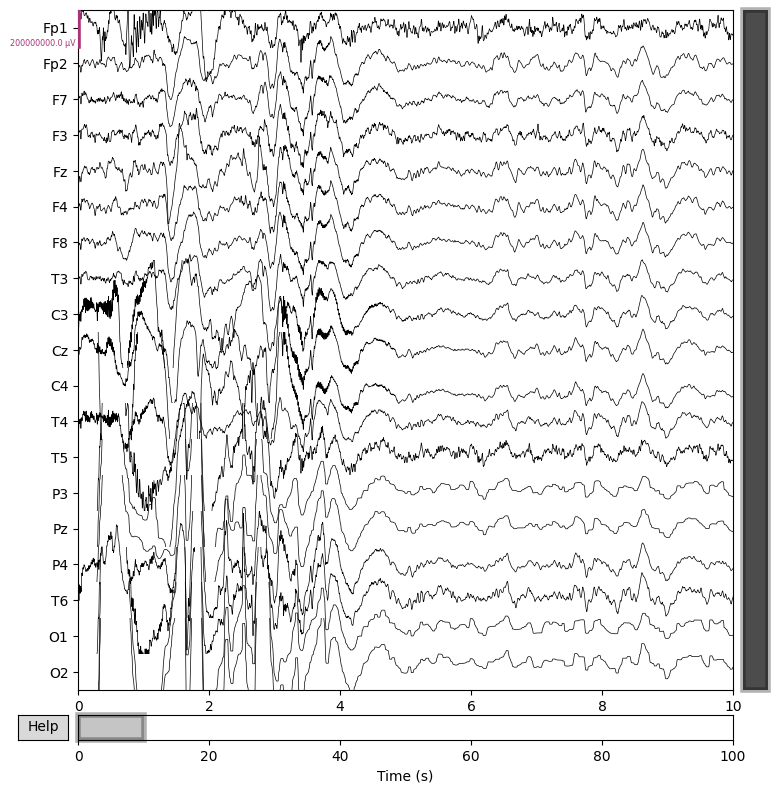

------------------* After Interpolation* ------------------- 


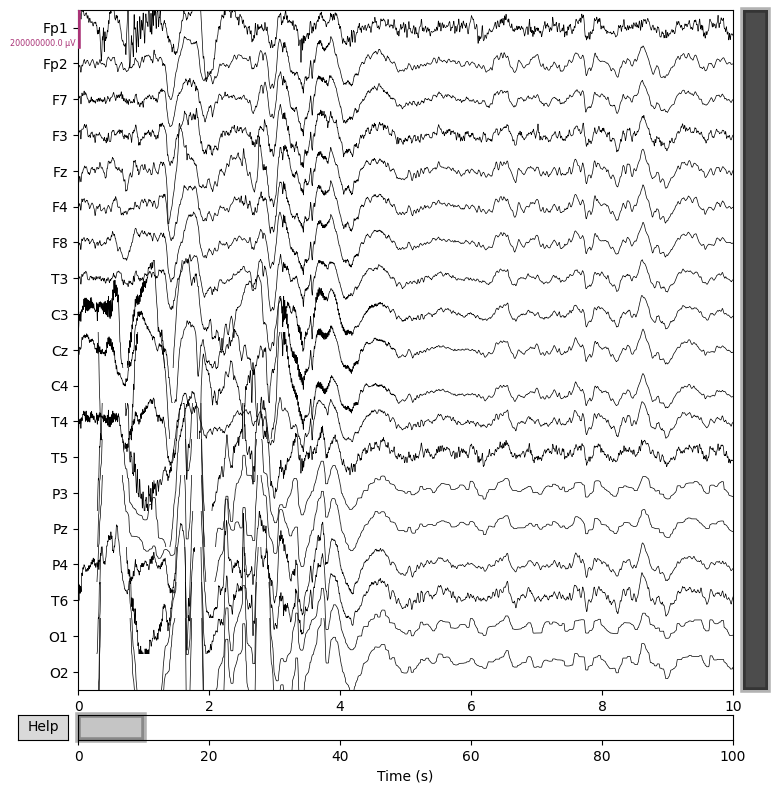

-------------------*before Interpolation* ---------------------


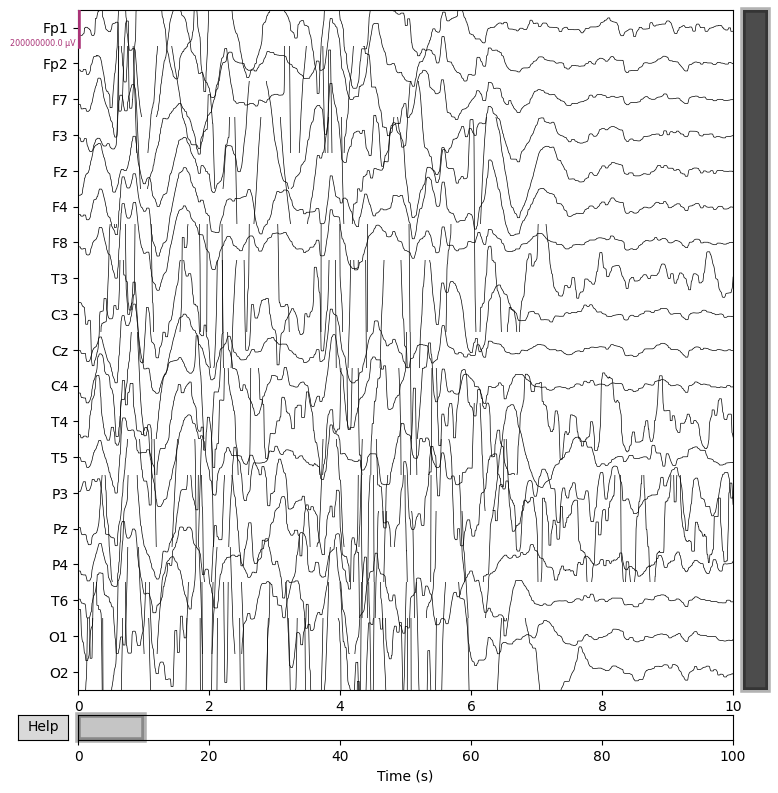

------------------* After Interpolation* ------------------- 


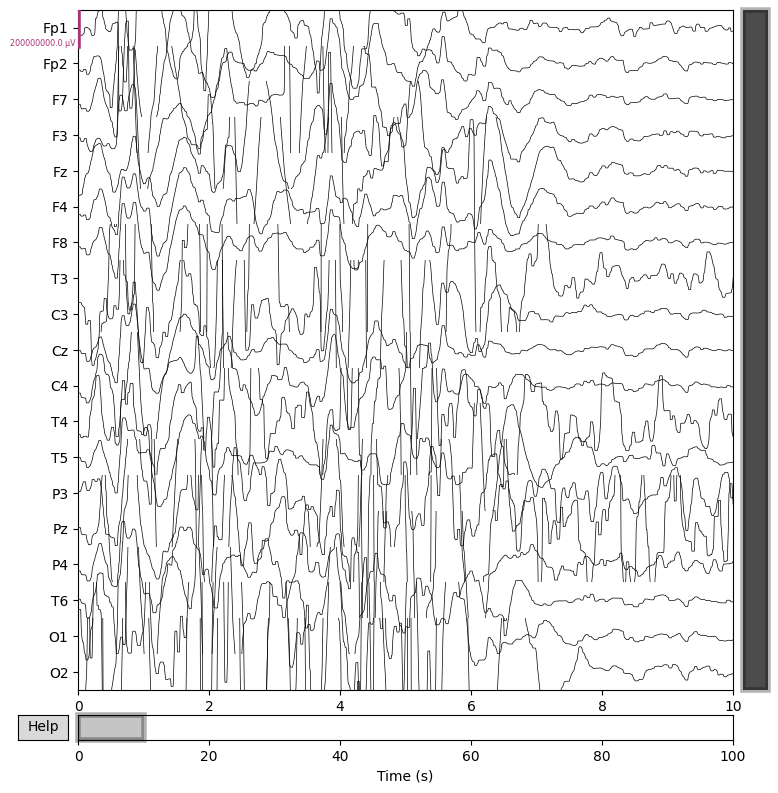

-------------------*before Interpolation* ---------------------


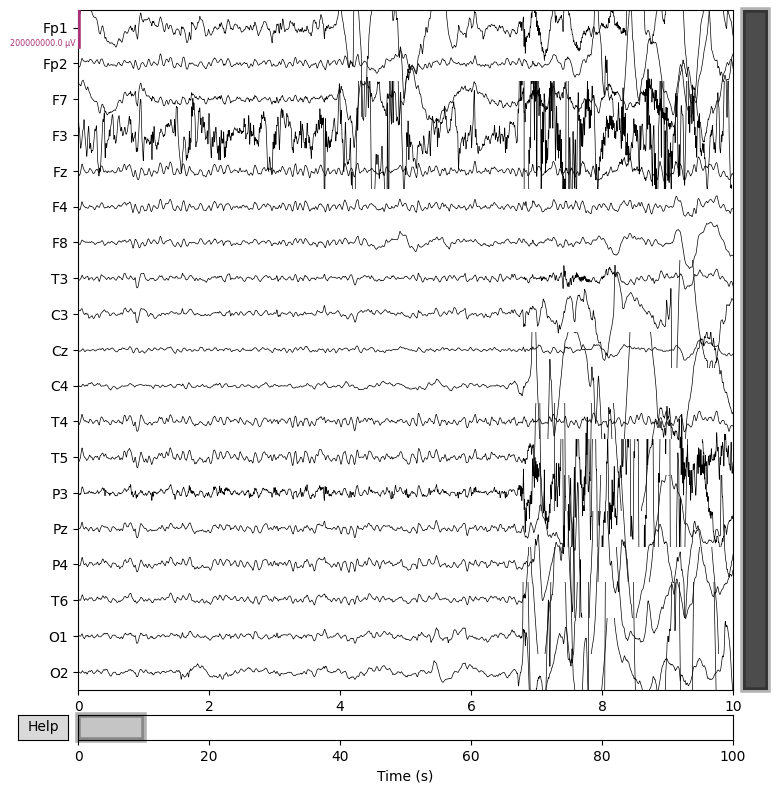

------------------* After Interpolation* ------------------- 


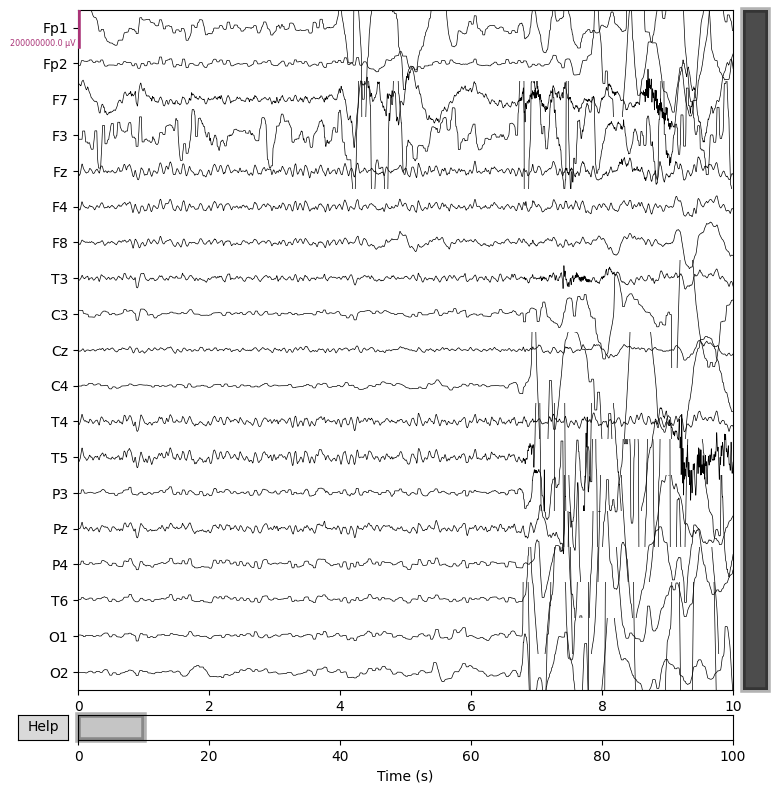

-------------------*before Interpolation* ---------------------


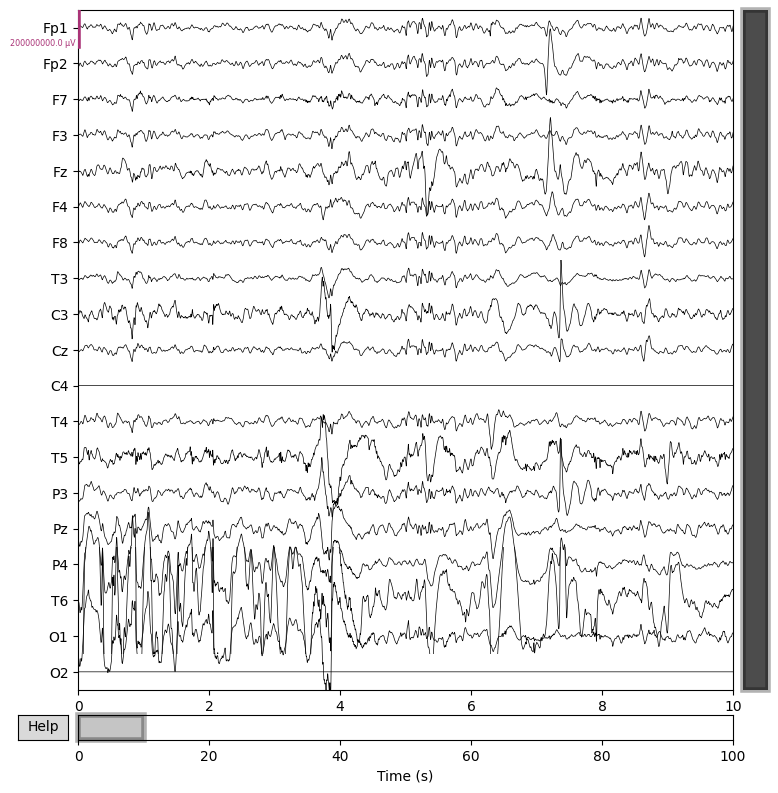

------------------* After Interpolation* ------------------- 


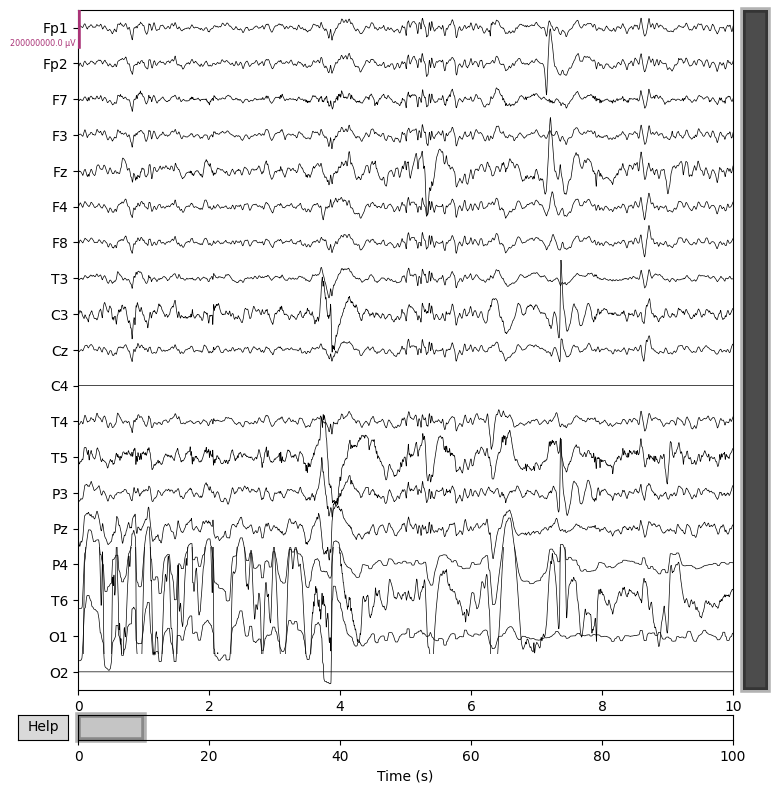

-------------------*before Interpolation* ---------------------


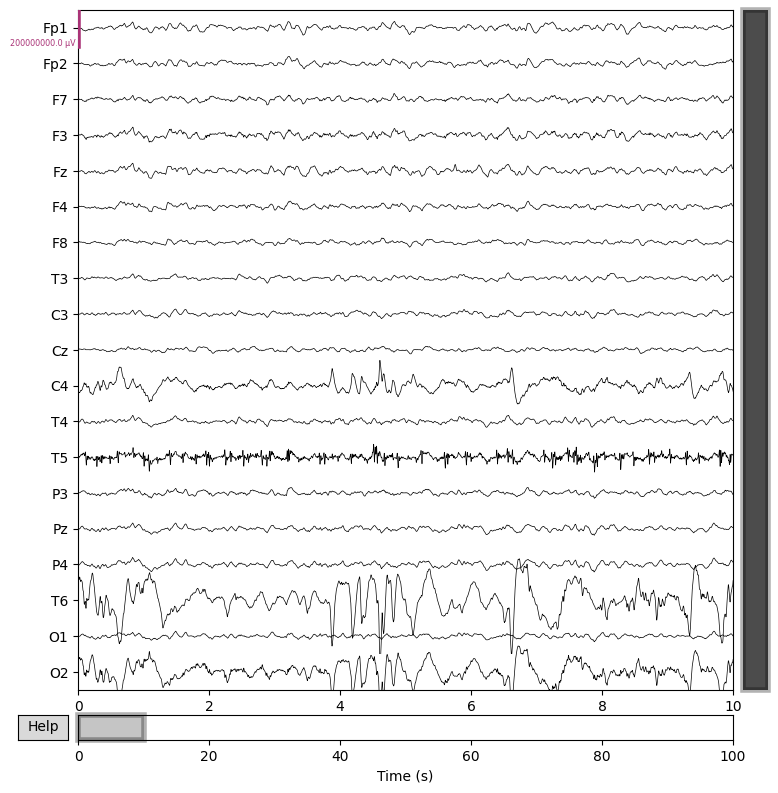

------------------* After Interpolation* ------------------- 


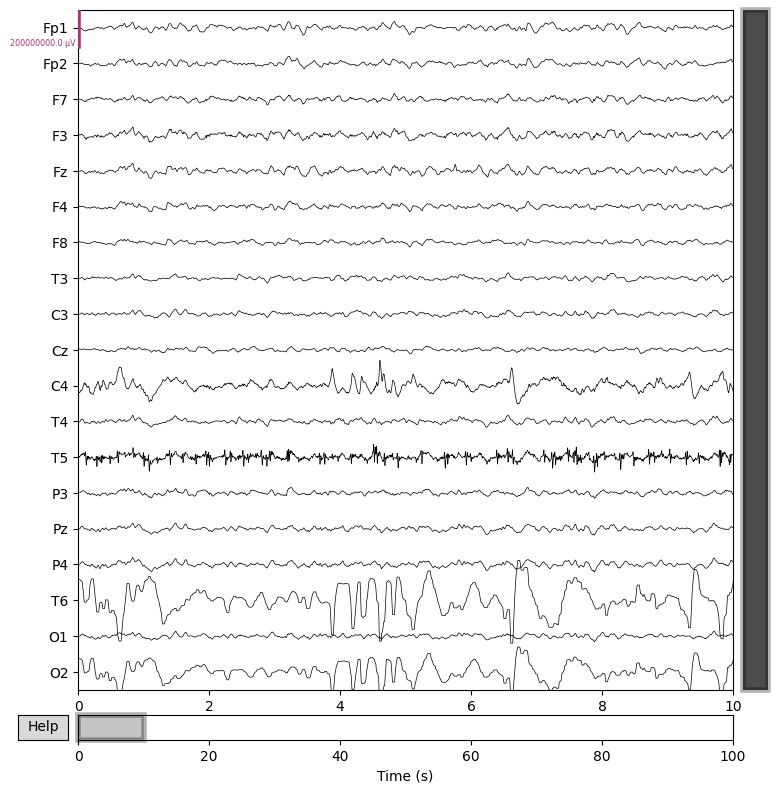

-------------------*before Interpolation* ---------------------


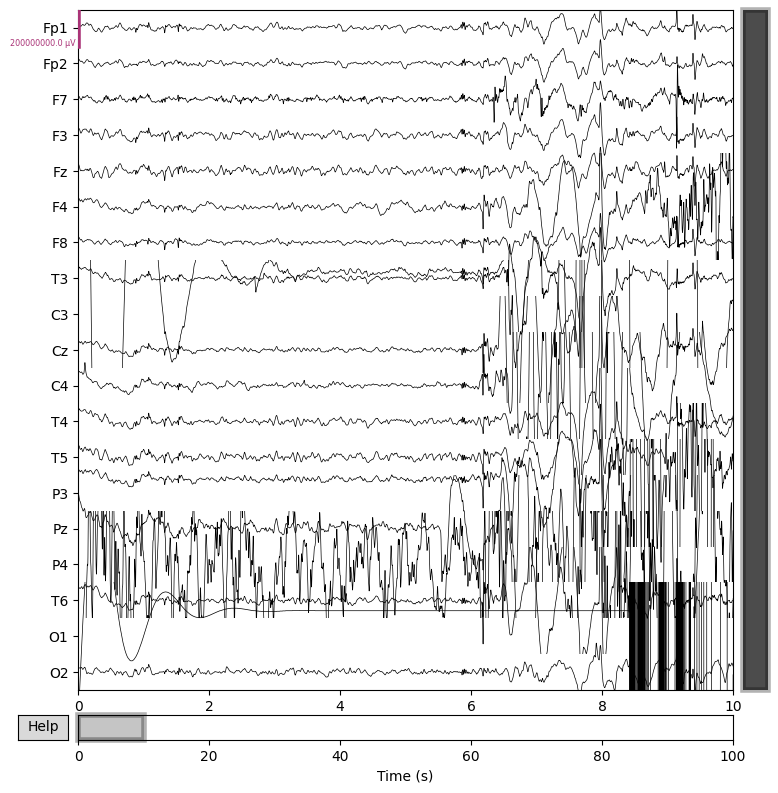

------------------* After Interpolation* ------------------- 


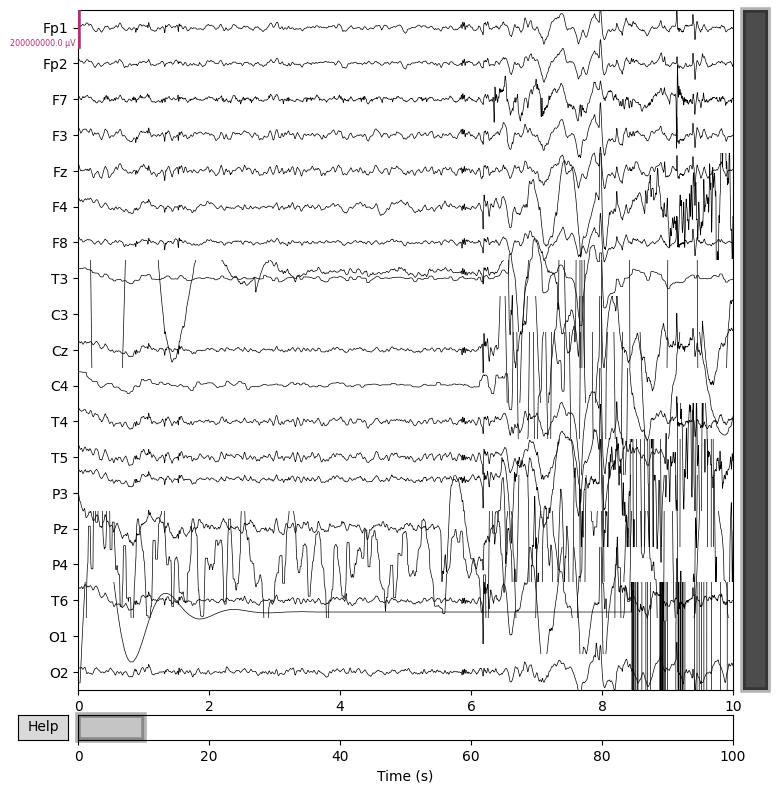

-------------------*before Interpolation* ---------------------


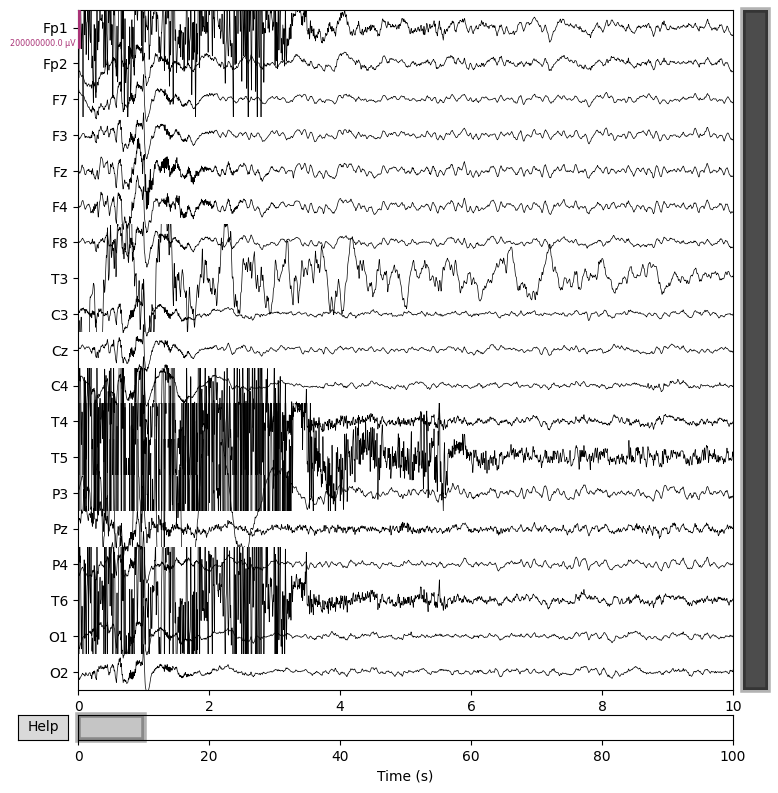

------------------* After Interpolation* ------------------- 


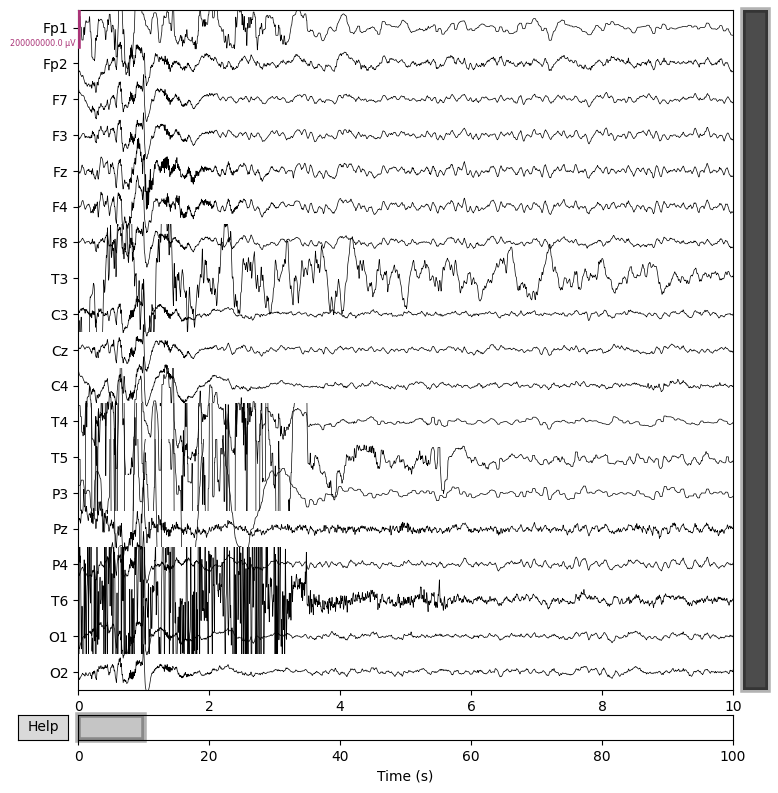

In [15]:
# fif_emer1
ch_median(fif_emer1_copy , 4 ,['P3','Pz','O1','O2'])
ch_median(fif_emer1_copy , 10 ,['Fp1', 'Fp2',
            'F7', 'F3', 'Fz', 'F4', 'F8',
            'T3', 'C3', 'Cz', 'C4', 'T4',
            'T5', 'P3', 'Pz', 'P4', 'T6',
            'O1', 'O2'])

ch_median(fif_emer1_copy ,11 ,['Fp1','F3','Fp2','C3','C4','P3','P4','T6','O1','O2'])

ch_median(fif_emer1_copy,17 , ['P4','O1','O2'])
ch_median(fif_emer1_copy ,18, ['T6','O2'])
ch_median(fif_emer1_copy , 21 ,['T3','C4','P4','O1'])
ch_median(fif_emer1_copy ,25,['Fp1','T4','T5','P3'] )


-------------------*before Interpolation* ---------------------


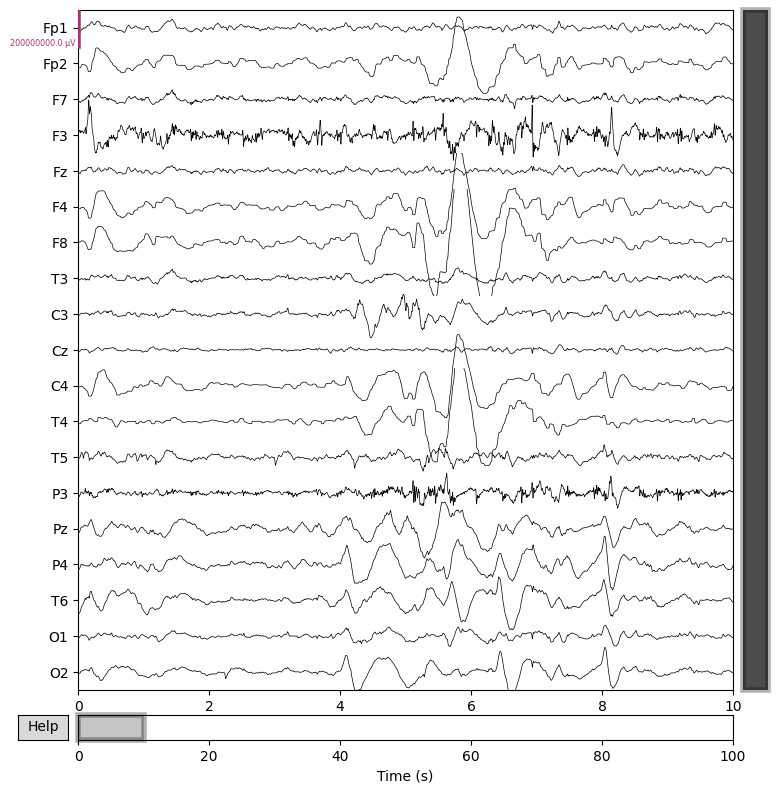

------------------* After Interpolation* ------------------- 


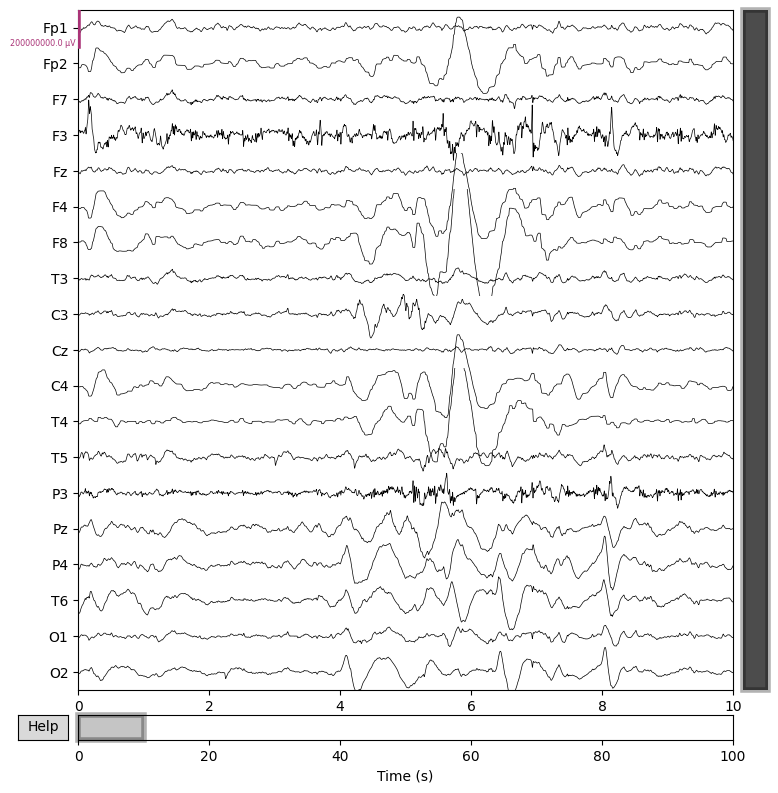

-------------------*before Interpolation* ---------------------


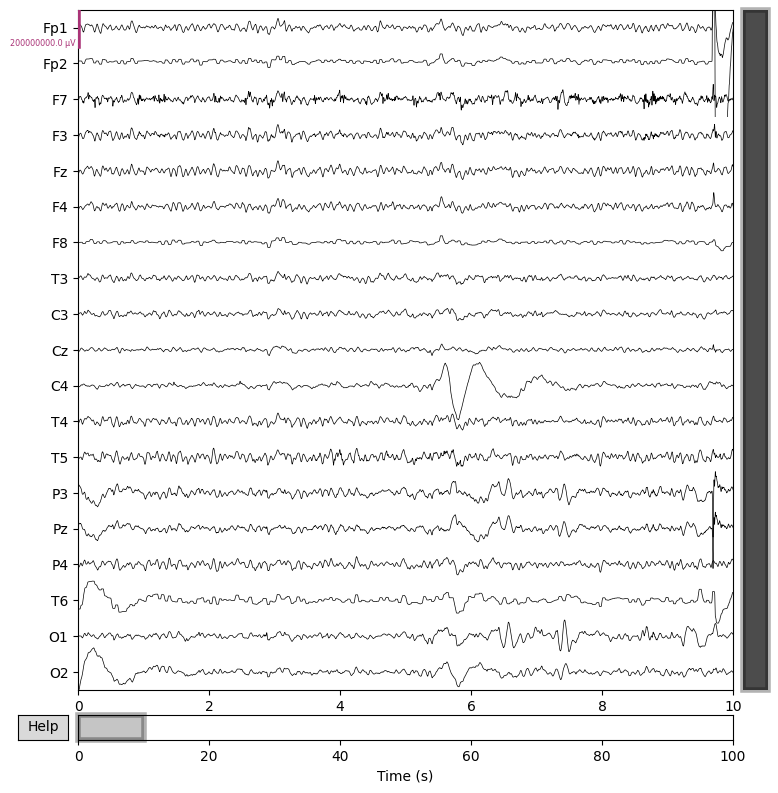

------------------* After Interpolation* ------------------- 


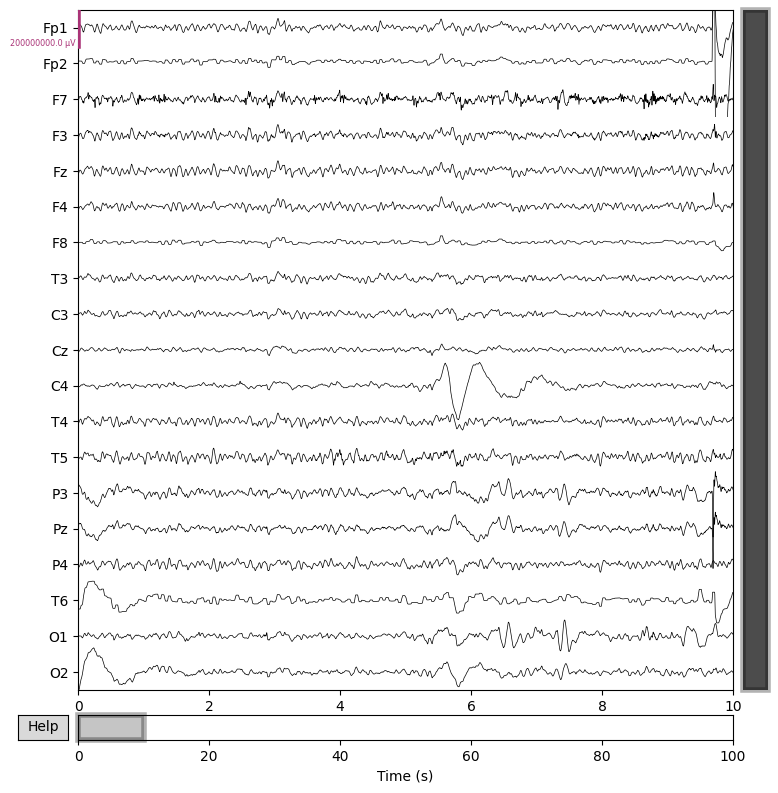

-------------------*before Interpolation* ---------------------


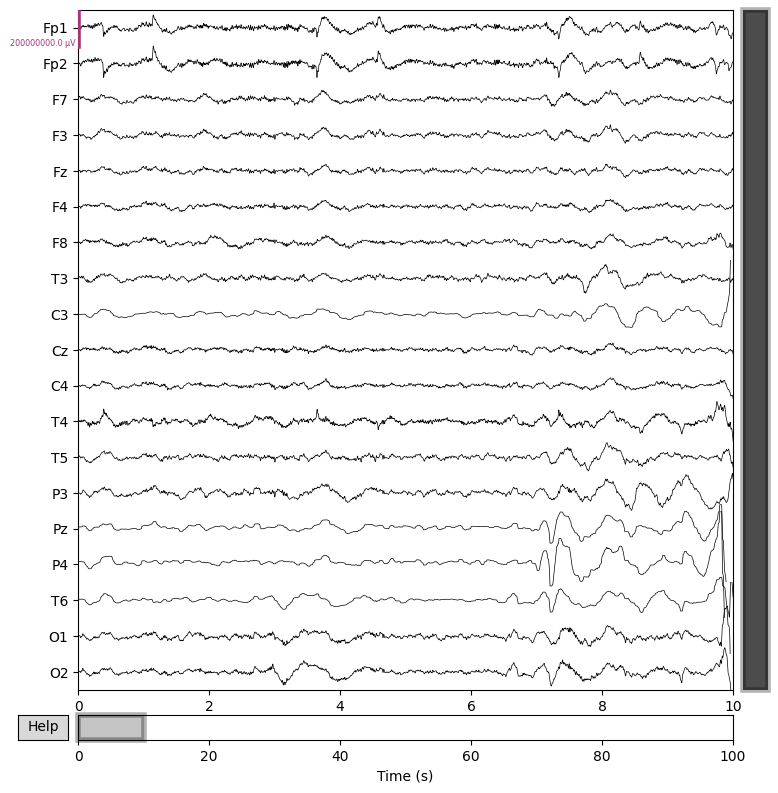

------------------* After Interpolation* ------------------- 


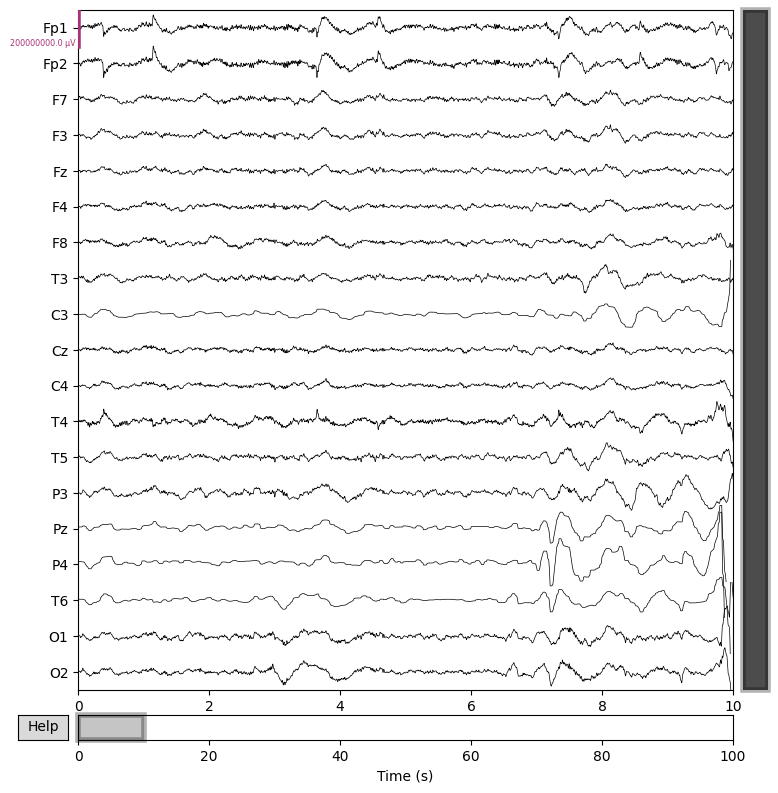

-------------------*before Interpolation* ---------------------


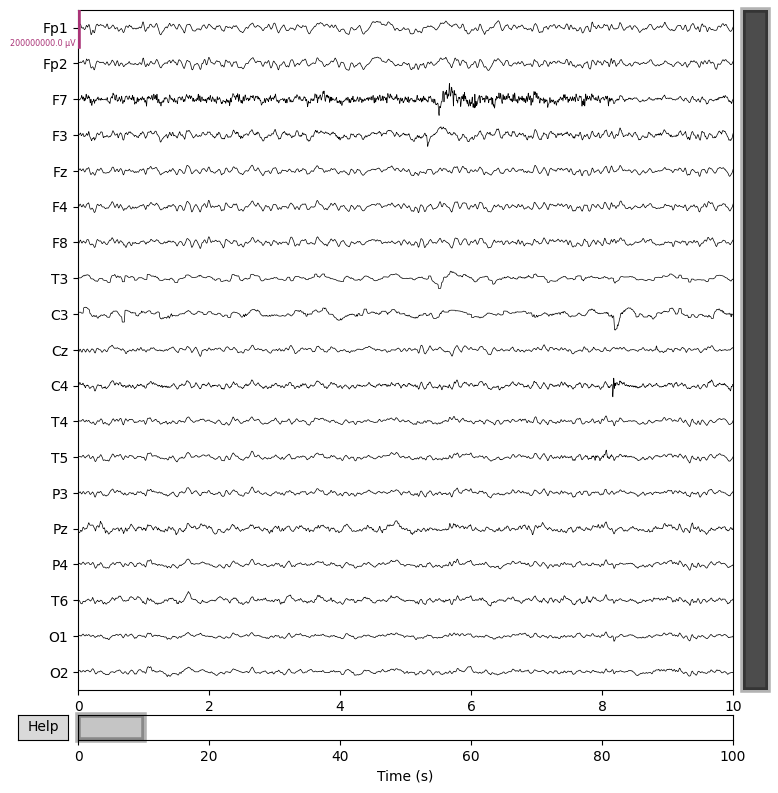

------------------* After Interpolation* ------------------- 


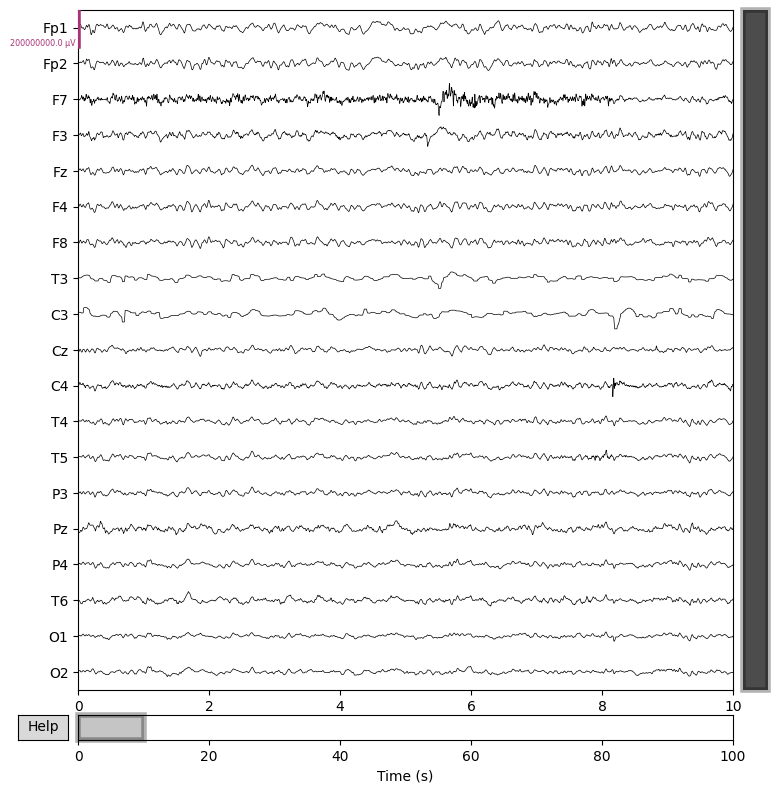

In [36]:
# fif_emer2
ch_median(fif_emer2_copy , 9 ,['Fp2','F4','F8','T4','C4'])
ch_median(fif_emer2_copy , 11, ['Fp2','F8','T6'])
ch_median(fif_emer2_copy ,27 , ['C3','Pz','P4','T6'])
ch_median(fif_emer2_copy , 37,['T3','C3'])



-------------------*before Interpolation* ---------------------


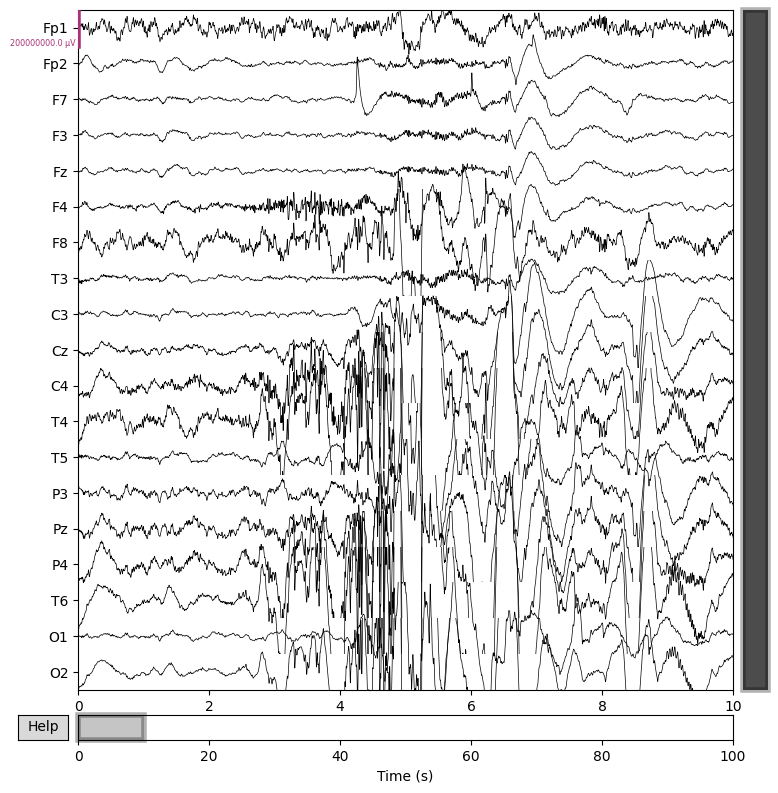

------------------* After Interpolation* ------------------- 


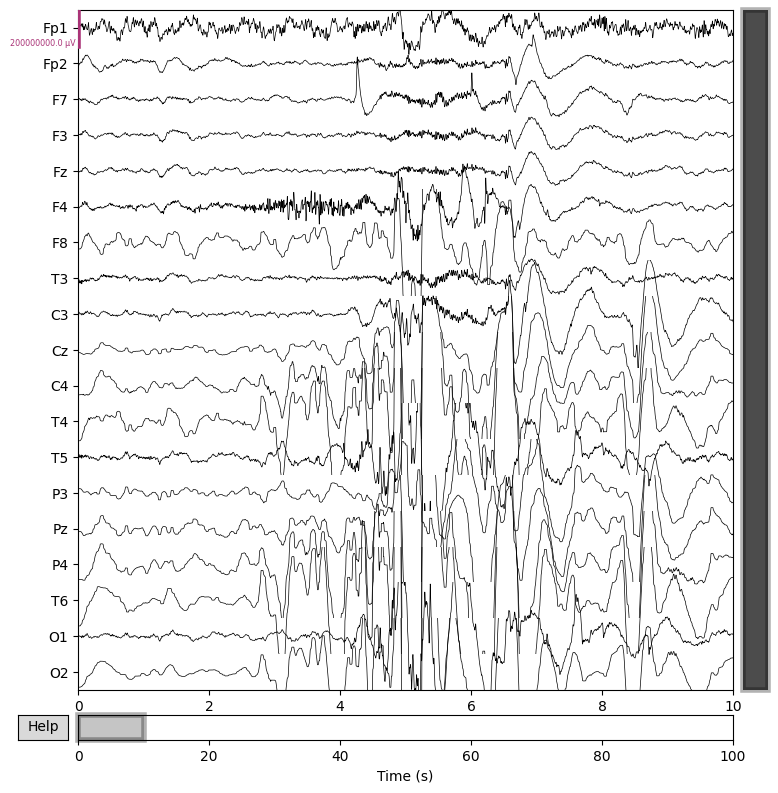

In [37]:
# fif_emer3 (18channels은 아예 오류)
ch_median(fif_emer3_copy , 27 ,['F8','Cz','C4','T4','P3','Pz','P4','T6','O2'])





-------------------*before Interpolation* ---------------------


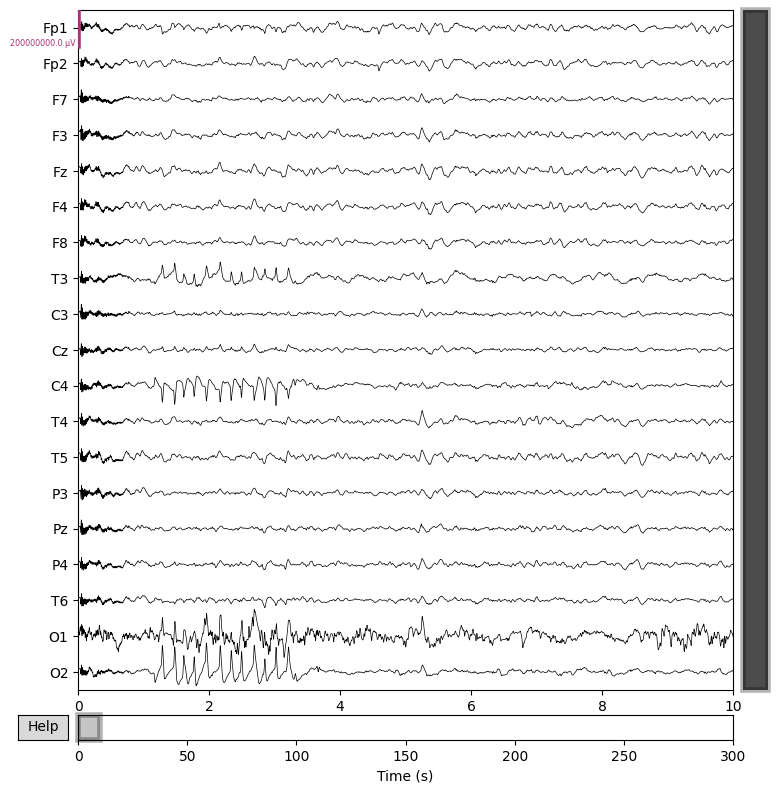

------------------* After Interpolation* ------------------- 


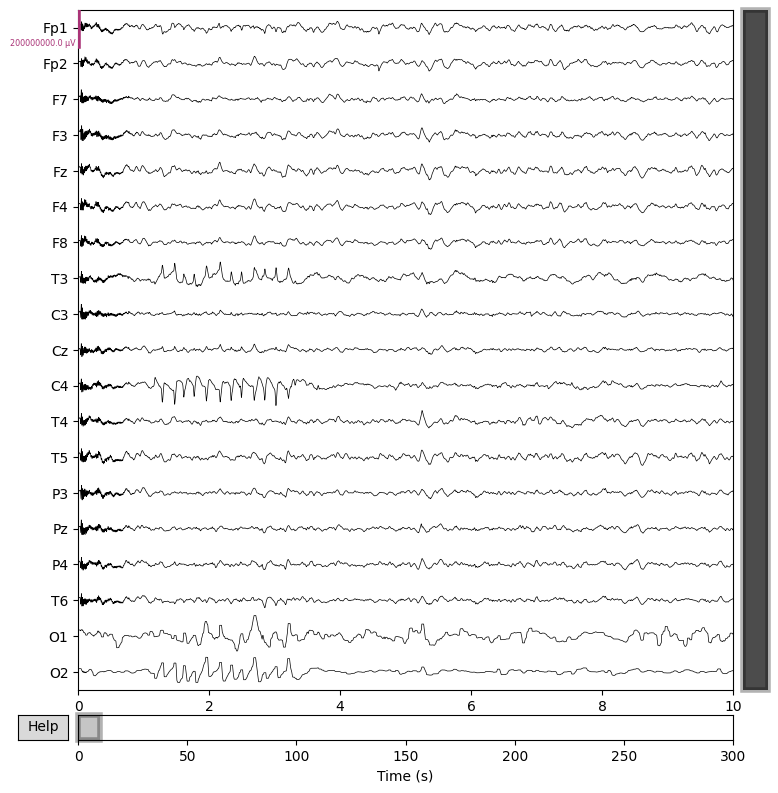

In [38]:
# mt
ch_median(fif_mt_copy , 17 , ['O1','O2'])



-------------------*before Interpolation* ---------------------


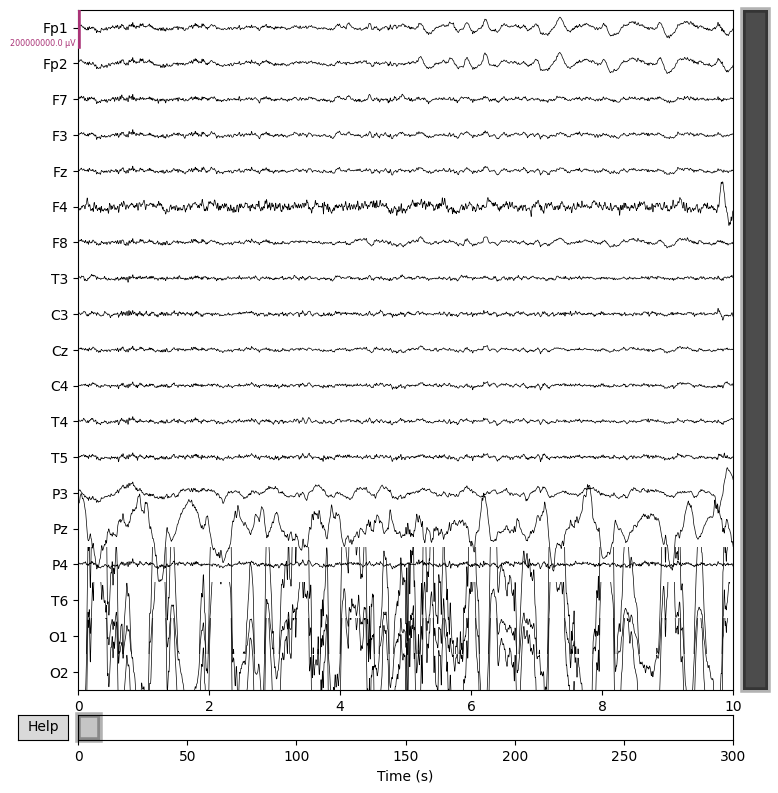

------------------* After Interpolation* ------------------- 


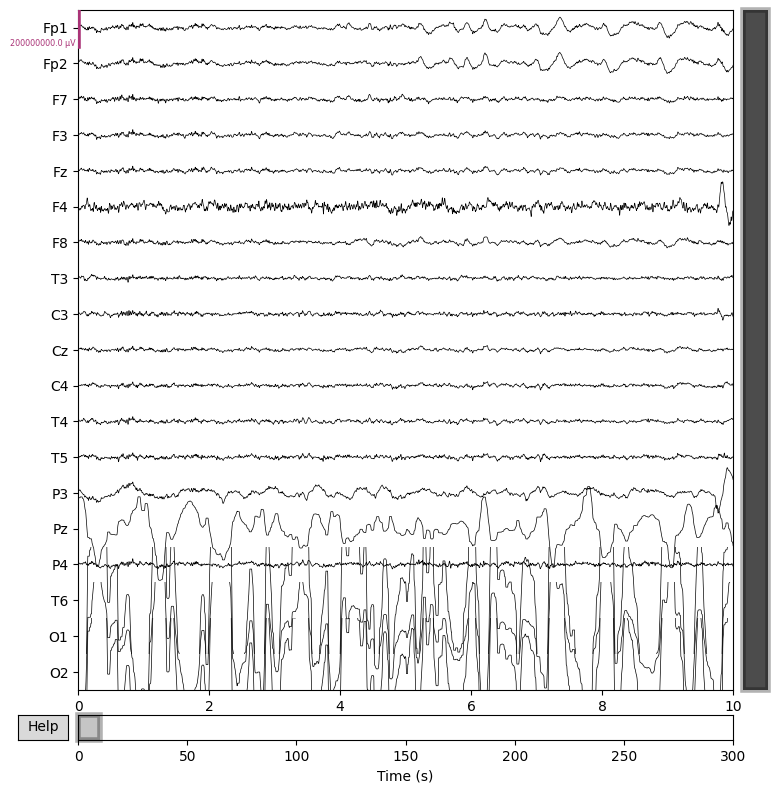

-------------------*before Interpolation* ---------------------


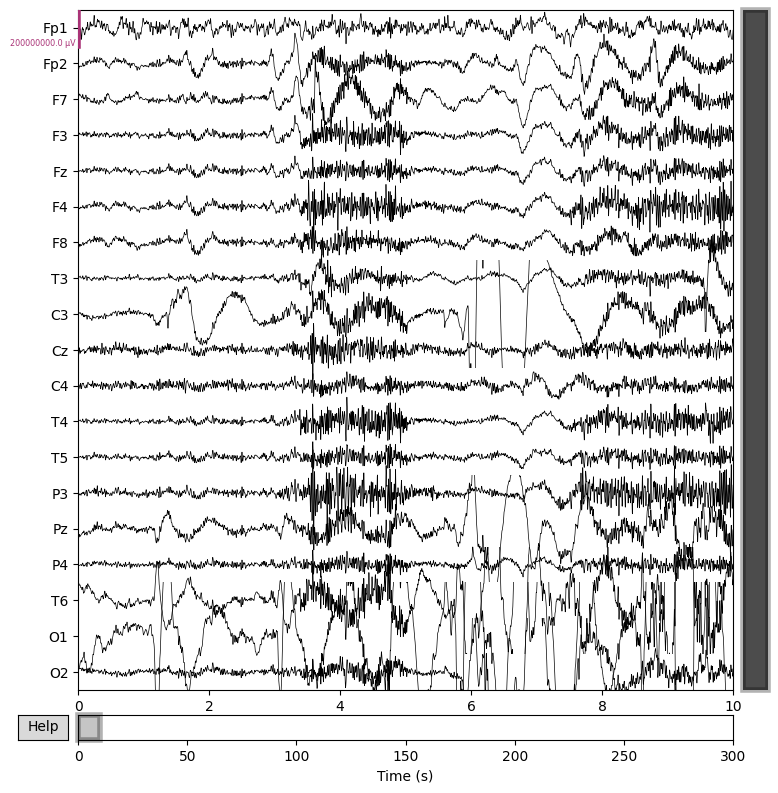

------------------* After Interpolation* ------------------- 


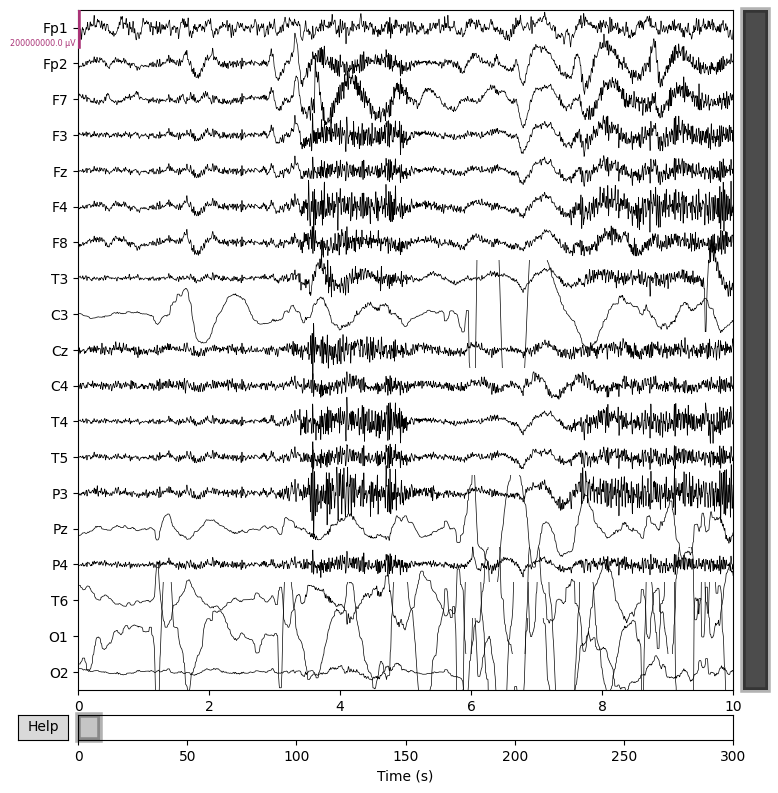

-------------------*before Interpolation* ---------------------


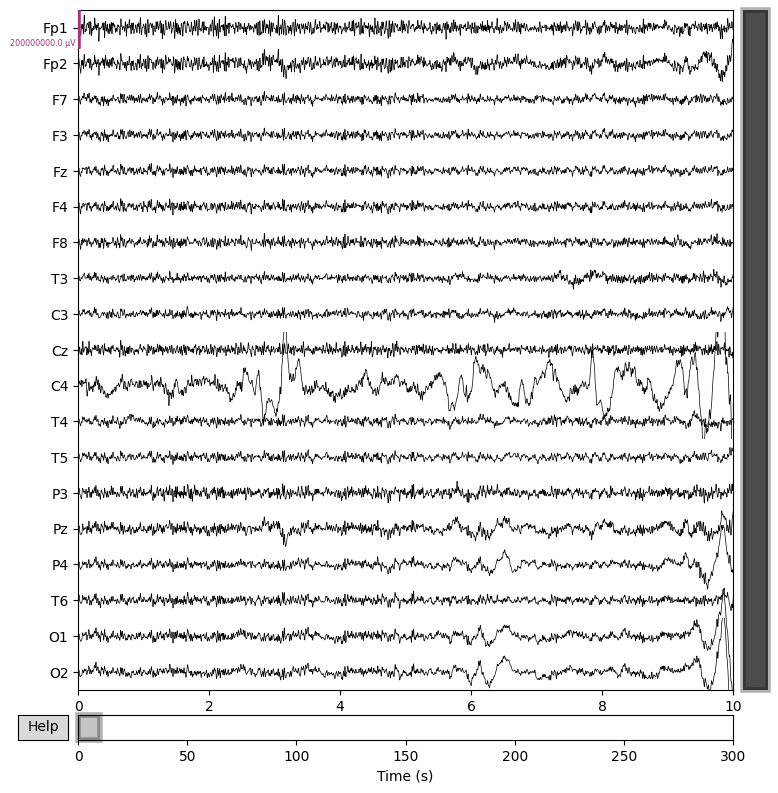

------------------* After Interpolation* ------------------- 


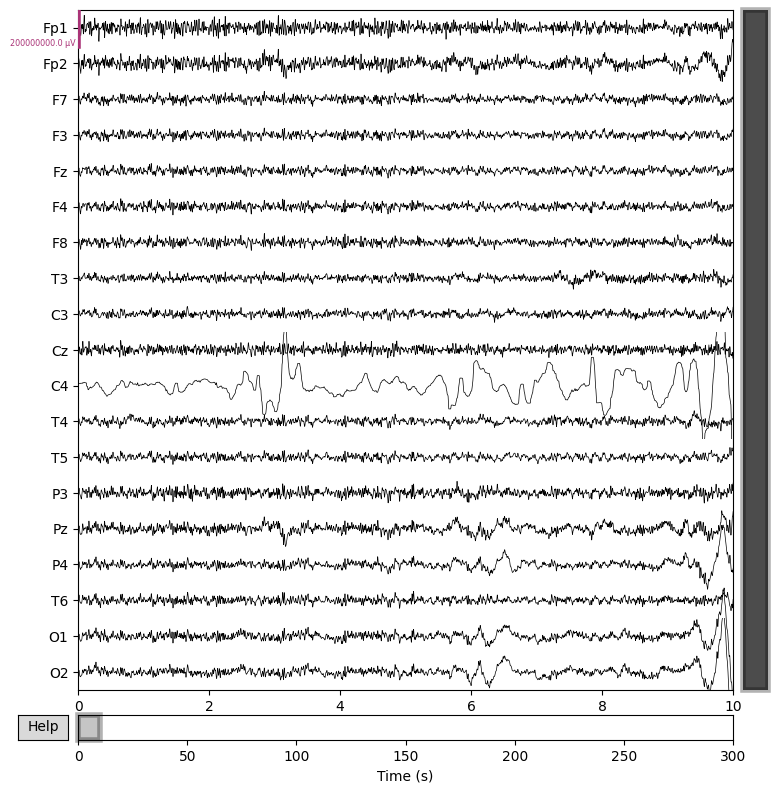

In [39]:
# rest

ch_median(fif_rest_copy ,3 ,['Pz','T6','O1','O2'] )
ch_median(fif_rest_copy , 4,['C3','Pz','T6','O1','O2'])
ch_median(fif_rest_copy , 10,['C4'])

In [25]:
# 마지막 보간
# -> ch 삭제하고 전체 평균(중간값)을 구한 다음에 그 값으로 채워 넣어주기 (즉 삭제후 보간)

print(len(fif_emer1_copy))

48


In [ ]:
def ch_dect(data):
    for i in range(len(data)):
        ch = data[i].plot(n_channels = 19 , scalings = {'eeg': 100})
        ch.savefig('time_2_f_{}'.format(2*i + 1))




# SVM Model Classification Test
# (before ICA  compoents) & large Noise

In [35]:
from sklearn import svm


# emer : del : 4 / 8 / 12 /23 /26 / 33 /34 /35 /46 /48
# X_train : emer(1~3) , mt , rest 3개가 들어감
# y_train(label) : 0 or 1  즉 del , No del


# train_data 준비

data_list = []
for raw in fif_emer1_copy:
    data = raw.get_data()
    data_flatten = data.reshape(-1)
    data_list.append(data_flatten)

data_combined = np.array(data_list)

print(data_combined.shape)

# 무작위 label
labels = np.random.randint(2, size=len(fif_emer1_copy))
print(labels.shape)




(48, 950019)
(48,)


<Figure size 1000x600 with 0 Axes>

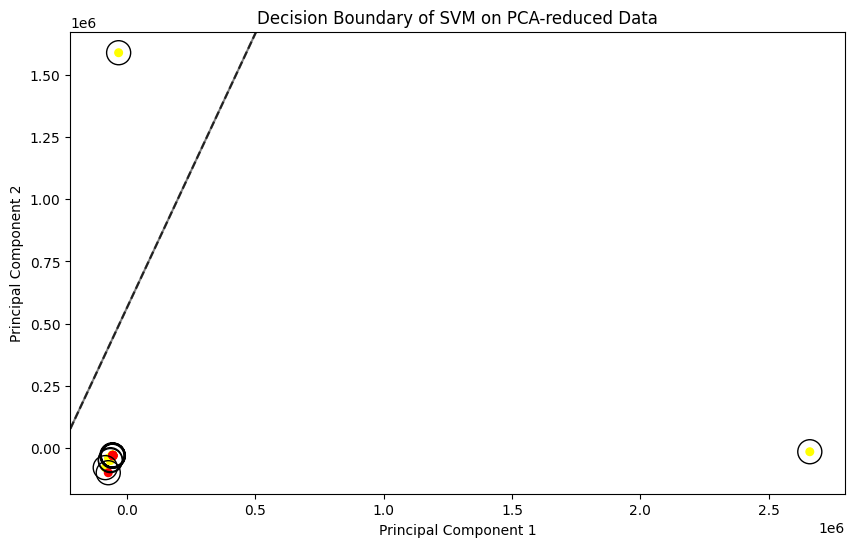

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(data_combined)


# SVC 모델 학습
svc = svm.SVC(kernel='linear')
svc.fit(X_train_pca, labels)




def plot_decision_boundary(clf, X, y, plot_support=True):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap='autumn')
    
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # 그리드 생성
    xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 50),
                         np.linspace(ylim[0], ylim[1], 50))
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # 결정 경계와 마진 그리기
    ax.contour(xx, yy, Z, colors='k', levels=[-1, 0, 1], alpha=0.5,
               linestyles=['--', '-', '--'])
    if plot_support:
        ax.scatter(clf.support_vectors_[:, 0],
                   clf.support_vectors_[:, 1],
                   s=300, linewidth=1, facecolors='none', edgecolors='k')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
# 결정 경계 시각화
plt.figure(figsize=(10, 6))
plot_decision_boundary(svc, X_train_pca, labels)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Decision Boundary of SVM on PCA-reduced Data')
plt.show()

# Start remove ICA compoentes & Large Noise

In [42]:
# ch 보간 -> fif_emer1_copy , fif_emer2_copy , fif_emer3_copy , fif_mt_copy , fif_rest_copy

# ICA
def Ica(data):

    icas = []
    #ica = mne.preprocessing.ICA(n_components=19 , random_state=98)
    for i in range(len(data)):
        ica = mne.preprocessing.ICA(n_components=19 , random_state=98)

        montage = mne.channels.make_standard_montage('standard_1020')
        data[i].set_montage(montage)
        data[i].filter(l_freq = 1.0 ,h_freq = None )

        ica.fit(data[i])
        icas.append(ica)
    return icas

def ica_remove(data ,icas , compoents):
    clean_data = []
    for i ,ica in enumerate(icas):
        ica.exclude = compoents[i]
        clean_data.append(ica.apply(data[i]))
    
    return clean_data
